In [1]:
import numpy as np
import pandas as pd 

from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.utils import to_categorical
from keras import regularizers

In [2]:
#fixed random seed for reproducibility 
np.random.seed(0)

In [3]:
# load dataset (input variables = X, output variables = Y)
df = pd.read_csv("2.csv")

#count the number of occurances for each osID
OsID_counts = df['OsID'].value_counts()

#filter for osIDs that have 10 or more occurances
OsID_counts_filtered = OsID_counts[OsID_counts >= 10]

#assign a label for each osID 
OsID_labels = {}
class_no = 0
for osID in OsID_counts_filtered.index:
    OsID_labels[osID] = class_no
    class_no +=1

#filter the dataset with osID that contain 10 or more occurances
dataGene = df[df['OsID'].isin(OsID_counts_filtered.index)]

dataGene = dataGene.drop(['Class', 'Trait'],axis=1)

# Add a new column 'class' to the filtered dataset
dataGene['class'] = dataGene['OsID'].map(OsID_labels)

#print("Summary of dataGene:\n",dataGene.describe())

In [4]:
X = dataGene.drop(['class','OsID'], axis=1) # exclude class & OsID column
Y = dataGene['class']

#input feature names in order of descending importance scores in MI feature selection method
feature_names = ['Root10DaysSeedling', 'Shoot10DaysSeedling', 'Root35DaysSeedling', 'Leaf45DaysOldPlant', 'Shoot35DaysSeedling',
                 'Root14DaysSeedling', 'Root24DaysSeedling', 'Root17DaysSeedling', 'Root21DaysSeedling', 'Shoot3DaysSeedling',
                 'Shoot21DaysSeedling', 'PCC', 'Shoot14DaysSeedling', 'Root52DaysSeedling', 'Shoot17DaysSeedling', 
                 'Leaf21DaysSeedling', 'log_2FoldChange', 'ET', 'PPI', 'CoExpression']

X_fs = X.reindex(columns=feature_names)

print("Shape of X:\n",X_fs.shape)
print("Shape of Y:\n",Y.shape)

# Statistical summary of the variables
#print("Summary of X:\n",X.describe())
#print("Summary of Y:\n",Y.describe())

# Check for class imbalance
print(df.groupby(Y).size())

# change both input and target variables datatype to ndarray

X_fs = X_fs.values # 2-D array

# select target variable 

Y = Y.values #1-D array
Y = Y.reshape(-1, 1)


Shape of X:
 (41110, 20)
Shape of Y:
 (41110,)
class
0.0      1800
1.0      1296
2.0      1260
3.0      1218
4.0      1026
5.0      1008
6.0       930
7.0       912
8.0       880
9.0       798
10.0      792
11.0      759
12.0      729
13.0      720
14.0      702
15.0      693
16.0      672
17.0      640
18.0      625
19.0      570
20.0      546
21.0      506
22.0      483
23.0      448
24.0      432
25.0      384
26.0      360
27.0      360
28.0      320
29.0      312
         ... 
343.0      12
344.0      12
345.0      12
346.0      12
347.0      12
348.0      12
349.0      12
350.0      12
351.0      12
352.0      12
353.0      12
354.0      12
355.0      11
356.0      11
357.0      11
358.0      11
359.0      11
360.0      11
361.0      10
362.0      10
363.0      10
364.0      10
365.0      10
366.0      10
367.0      10
368.0      10
369.0      10
370.0      10
371.0      10
372.0      10
Length: 373, dtype: int64


Class=0, n=1800 (4.378%)
Class=1, n=1296 (3.153%)
Class=2, n=1260 (3.065%)
Class=3, n=1218 (2.963%)
Class=4, n=1026 (2.496%)
Class=5, n=1008 (2.452%)
Class=6, n=930 (2.262%)
Class=7, n=912 (2.218%)
Class=8, n=880 (2.141%)
Class=9, n=798 (1.941%)
Class=10, n=792 (1.927%)
Class=11, n=759 (1.846%)
Class=12, n=729 (1.773%)
Class=13, n=720 (1.751%)
Class=14, n=702 (1.708%)
Class=15, n=693 (1.686%)
Class=16, n=672 (1.635%)
Class=17, n=640 (1.557%)
Class=18, n=625 (1.520%)
Class=19, n=570 (1.387%)
Class=20, n=546 (1.328%)
Class=21, n=506 (1.231%)
Class=22, n=483 (1.175%)
Class=23, n=448 (1.090%)
Class=24, n=432 (1.051%)
Class=25, n=384 (0.934%)
Class=26, n=360 (0.876%)
Class=27, n=360 (0.876%)
Class=28, n=320 (0.778%)
Class=29, n=312 (0.759%)
Class=30, n=312 (0.759%)
Class=31, n=306 (0.744%)
Class=32, n=304 (0.739%)
Class=33, n=299 (0.727%)
Class=34, n=297 (0.722%)
Class=35, n=296 (0.720%)
Class=36, n=280 (0.681%)
Class=37, n=264 (0.642%)
Class=38, n=260 (0.632%)
Class=39, n=253 (0.615%)
Clas

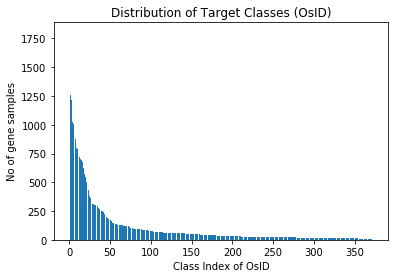

In [5]:
from collections import Counter
# summarize distribution
counter = Counter(Y.flatten())

# sort counter by keys
counter = dict(sorted(counter.items()))

for k,v in counter.items():
 per = v / len(Y.flatten()) * 100
 print('Class=%d, n=%d (%.3f%%)' % (k, v, per))
# plot the distribution
plt.bar( counter.keys(), counter.values())

plt.ylabel('No of gene samples')
plt.xlabel('Class Index of OsID')
plt.title('Distribution of Target Classes (OsID)')
plt.show()

In [6]:
def draw_confusion_matrix(cm):
    plt.figure(figsize=(12,8))
    sns.heatmap(cm,annot=True,fmt="d", center=0, cmap='autumn') 
    plt.title("Confusion Matrix")
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

In [7]:
# prepare target data
def prepare_targets(y_train, y_test):
	le = LabelEncoder()
	
	#fit the encoders only to the training data and then transform both train and test data
	y_train_enc = le.fit_transform(y_train)
	y_test_enc = le.transform(y_test)

	return y_train_enc, y_test_enc

In [8]:
# define baseline model (MLP)
def MLP_model(input_dim):

    model = Sequential()
    model.add(Dense(60, input_dim=input_dim,bias_initializer='normal', activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(20,bias_initializer='normal',activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(20,bias_initializer='normal',activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(373,kernel_initializer='normal', activation='softmax')) #softmax for multi-class classification, num_classes = 373

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    return model

In [9]:
# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_fs, Y, test_size=0.33, random_state=1)

# prepare output data
y_train_enc, y_test_enc = prepare_targets(y_train, y_test)

# Define the number of folds for k-fold cross-validation
k = 2

# Define the cross-validation method
cv_method = StratifiedKFold(n_splits=k)

# Initialize the list to store the history, train & validation(accuracy & loss) for each model
models = []
model_history = []
model_accuracy = []
model_train_acc = []
model_train_loss = []
model_val_acc = []
model_val_loss = []


for i in range(1,21):

    models_fold = []
    hist = []
    train_accuracy = []
    train_loss = []
    val_accuracy = []
    val_loss = []
    test_accuracy = []

    print("Number of input features:",i)

    # Select the input features from the input data
    X_train_selected = X_train[:, :i]
    X_test_selected = X_test[:, :i]

    # Loop over the folds
    for fold, (train_index, val_index) in enumerate(cv_method.split(X_train_selected, y_train)):

        print("Fold:", fold+1)

        # Split the data into train and validation sets using the current fold index
        X_train_fold  = X_train_selected[train_index]
        y_train_fold  = y_train[train_index]
        X_val_fold = X_train_selected[val_index]
        y_val_fold = y_train[val_index]

        # Prepare the target data
        y_train_fold_enc, y_val_fold_enc = prepare_targets(y_train_fold, y_val_fold)

        # build the model
        model = MLP_model(i)

        # Fit the model to the training data for the current fold
        history = model.fit(X_train_fold, to_categorical(y_train_fold_enc, num_classes=373), epochs=20, batch_size=5, verbose=1, validation_split = 0.33)
    
        # Evaluate the model on the validation data for the current fold
        val_scores = model.evaluate(X_val_fold, to_categorical(y_val_fold_enc, num_classes=373), verbose=0)
        val_accuracy.append(val_scores[1])
        val_loss.append(val_scores[0])

        # Evaluate the model on the test data for the current fold
        test_scores = model.evaluate(X_test_selected, to_categorical(y_test_enc, num_classes=373), verbose=0)
        test_accuracy.append(test_scores[1])

        # add the model to the list of models
        models_fold.append(model)
        hist.append(history)

        # store the training accuracy and loss for each fold
        train_accuracy.append(history.history['accuracy'])
        train_loss.append(history.history['loss'])
        
    # Calculate the average test and validation accuracy and loss across all folds
    avg_test_acc = sum(test_accuracy) / len(test_accuracy)
    avg_val_acc = sum(val_accuracy) / len(val_accuracy)
    avg_val_loss = sum(val_loss) / len(val_loss)

    # Print the average validation and test accuracy and loss
    print("Average Validation Accuracy:", avg_val_acc)
    print("Average Validation Loss:",avg_val_loss)
    print("Average Test Accuracy:", avg_test_acc)

    best_fold_index = test_accuracy.index(max(test_accuracy))
    model_accuracy.append(test_accuracy[best_fold_index])
    models.append(models_fold[best_fold_index])
    model_history.append(hist[best_fold_index])
    model_train_acc.append(train_accuracy[best_fold_index])
    model_train_loss.append(train_loss[best_fold_index])
    model_val_acc.append(val_accuracy[best_fold_index])
    model_val_loss.append(val_loss[best_fold_index])


    print("Final Test Accuracy for each fold:", test_accuracy[best_fold_index])

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated i

Number of input features: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  fold_sizes = np.full(n_splits, n_samples // n_splits, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; f

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/20
1834/1834 [==============================] - 16s 5ms/step - loss: 4.5130 - accuracy: 0.1019 - val_loss: 4.1474 - val_accuracy: 0.1382
Epoch 2/20
1834/1834 [==============================] - 10s 5ms/step - loss: 3.8263 - accuracy: 0.1628 - val_loss: 3.8560 - val_accuracy: 0.1760
Epoch 3/20
1834/1834 [==============================] - 9s 5ms/step - loss: 3.5110 - accuracy: 0.2142 - val_loss: 3.5786 - val_accuracy: 0.2422
Epoch 4/20
1834/1834 [==============================] - 9s 5ms/step - loss: 3.2128 - accuracy: 0.2513 - val_loss: 3.3245 - val_accuracy: 0.2739
Epoch 5/20
1834/1834 [==============================] - 9s 5ms/step - loss: 2.9694 - accuracy: 0.2943 - val_loss: 3.1328 - val_accuracy: 0.3220
Epoch 6/20
1834/1834 [==============================] - 8s 4ms/step - loss: 2.7895 - accuracy: 0.3254 - val_loss: 3.0157 - val_accuracy: 0.3198
Epoch 7/20
1834/1834 [==============================] - 9s 5ms/step - loss: 2.6500 - accuracy: 0.3534 - val_loss: 2.8862 - val_accurac

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/20
1834/1834 [==============================] - 14s 6ms/step - loss: 3.8697 - accuracy: 0.2310 - val_loss: 3.1918 - val_accuracy: 0.3647
Epoch 2/20
1834/1834 [==============================] - 9s 5ms/step - loss: 2.5597 - accuracy: 0.4560 - val_loss: 2.4232 - val_accuracy: 0.4993
Epoch 3/20
1834/1834 [==============================] - 9s 5ms/step - loss: 1.9308 - accuracy: 0.5572 - val_loss: 1.9936 - val_accuracy: 0.5587
Epoch 4/20
1834/1834 [==============================] - 8s 5ms/step - loss: 1.5662 - accuracy: 0.6107 - val_loss: 1.7499 - val_accuracy: 0.6138
Epoch 5/20
1834/1834 [==============================] - 9s 5ms/step - loss: 1.3699 - accuracy: 0.6425 - val_loss: 1.5537 - val_accuracy: 0.6590
Epoch 6/20
1834/1834 [==============================] - 9s 5ms/step - loss: 1.2291 - accuracy: 0.6674 - val_loss: 1.4137 - val_accuracy: 0.7254
Epoch 7/20
1834/1834 [==============================] - 8s 4ms/step - loss: 1.1338 - accuracy: 0.6886 - val_loss: 1.4044 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/20
1834/1834 [==============================] - 14s 5ms/step - loss: 3.7833 - accuracy: 0.2820 - val_loss: 2.8520 - val_accuracy: 0.4701
Epoch 2/20
1834/1834 [==============================] - 9s 5ms/step - loss: 2.1486 - accuracy: 0.5800 - val_loss: 2.0299 - val_accuracy: 0.6081
Epoch 3/20
1834/1834 [==============================] - 9s 5ms/step - loss: 1.5179 - accuracy: 0.6771 - val_loss: 1.6114 - val_accuracy: 0.6940
Epoch 4/20
1834/1834 [==============================] - 9s 5ms/step - loss: 1.1917 - accuracy: 0.7268 - val_loss: 1.3646 - val_accuracy: 0.7431
Epoch 5/20
1834/1834 [==============================] - 8s 5ms/step - loss: 0.9993 - accuracy: 0.7643 - val_loss: 1.2582 - val_accuracy: 0.7535
Epoch 6/20
1834/1834 [==============================] - 8s 5ms/step - loss: 0.8777 - accuracy: 0.7832 - val_loss: 1.1308 - val_accuracy: 0.7586
Epoch 7/20
1834/1834 [==============================] - 9s 5ms/step - loss: 0.7903 - accuracy: 0.7964 - val_loss: 1.0504 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/20
1834/1834 [==============================] - 14s 5ms/step - loss: 3.5344 - accuracy: 0.3329 - val_loss: 2.5492 - val_accuracy: 0.5496
Epoch 2/20
1834/1834 [==============================] - 9s 5ms/step - loss: 1.7591 - accuracy: 0.6667 - val_loss: 1.6452 - val_accuracy: 0.7201
Epoch 3/20
1834/1834 [==============================] - 9s 5ms/step - loss: 1.1523 - accuracy: 0.7559 - val_loss: 1.3321 - val_accuracy: 0.7755
Epoch 4/20
1834/1834 [==============================] - 9s 5ms/step - loss: 0.8583 - accuracy: 0.8016 - val_loss: 1.0887 - val_accuracy: 0.7896
Epoch 5/20
1834/1834 [==============================] - 9s 5ms/step - loss: 0.7012 - accuracy: 0.8244 - val_loss: 0.9393 - val_accuracy: 0.7947
Epoch 6/20
1834/1834 [==============================] - 9s 5ms/step - loss: 0.6080 - accuracy: 0.8413 - val_loss: 0.8131 - val_accuracy: 0.8472
Epoch 7/20
1834/1834 [==============================] - 9s 5ms/step - loss: 0.5335 - accuracy: 0.8573 - val_loss: 0.8208 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/20
1834/1834 [==============================] - 14s 5ms/step - loss: 3.4820 - accuracy: 0.3569 - val_loss: 2.3296 - val_accuracy: 0.5795
Epoch 2/20
1834/1834 [==============================] - 8s 5ms/step - loss: 1.5004 - accuracy: 0.7239 - val_loss: 1.3544 - val_accuracy: 0.7524
Epoch 3/20
1834/1834 [==============================] - 8s 4ms/step - loss: 0.8944 - accuracy: 0.8140 - val_loss: 0.9829 - val_accuracy: 0.8260
Epoch 4/20
1834/1834 [==============================] - 9s 5ms/step - loss: 0.6512 - accuracy: 0.8504 - val_loss: 0.7824 - val_accuracy: 0.8625
Epoch 5/20
1834/1834 [==============================] - 10s 5ms/step - loss: 0.5214 - accuracy: 0.8738 - val_loss: 0.6997 - val_accuracy: 0.8687
Epoch 6/20
1834/1834 [==============================] - 8s 5ms/step - loss: 0.4451 - accuracy: 0.8873 - val_loss: 0.6393 - val_accuracy: 0.8720
Epoch 7/20
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3966 - accuracy: 0.8960 - val_loss: 0.5619 - val

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/20
1834/1834 [==============================] - 11s 4ms/step - loss: 3.6381 - accuracy: 0.3231 - val_loss: 2.5464 - val_accuracy: 0.5616
Epoch 2/20
1834/1834 [==============================] - 5s 3ms/step - loss: 1.6519 - accuracy: 0.7021 - val_loss: 1.4670 - val_accuracy: 0.7498
Epoch 3/20
1834/1834 [==============================] - 5s 3ms/step - loss: 0.9608 - accuracy: 0.8076 - val_loss: 1.0466 - val_accuracy: 0.8160
Epoch 4/20
1834/1834 [==============================] - 5s 3ms/step - loss: 0.6784 - accuracy: 0.8511 - val_loss: 0.8401 - val_accuracy: 0.8454
Epoch 5/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5452 - accuracy: 0.8724 - val_loss: 0.7276 - val_accuracy: 0.8643
Epoch 6/20
1834/1834 [==============================] - 5s 3ms/step - loss: 0.4618 - accuracy: 0.8856 - val_loss: 0.6704 - val_accuracy: 0.8860
Epoch 7/20
1834/1834 [==============================] - 5s 3ms/step - loss: 0.4067 - accuracy: 0.8961 - val_loss: 0.5779 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/20
1834/1834 [==============================] - 9s 3ms/step - loss: 3.5115 - accuracy: 0.3413 - val_loss: 2.4154 - val_accuracy: 0.5744
Epoch 2/20
1834/1834 [==============================] - 5s 3ms/step - loss: 1.6550 - accuracy: 0.6750 - val_loss: 1.4895 - val_accuracy: 0.7471
Epoch 3/20
1834/1834 [==============================] - 5s 3ms/step - loss: 1.0023 - accuracy: 0.7910 - val_loss: 1.1063 - val_accuracy: 0.7883
Epoch 4/20
1834/1834 [==============================] - 5s 3ms/step - loss: 0.7077 - accuracy: 0.8416 - val_loss: 0.8770 - val_accuracy: 0.8297
Epoch 5/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.5613 - accuracy: 0.8651 - val_loss: 0.8053 - val_accuracy: 0.8463
Epoch 6/20
1834/1834 [==============================] - 5s 3ms/step - loss: 0.4747 - accuracy: 0.8828 - val_loss: 0.6675 - val_accuracy: 0.8601
Epoch 7/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.4195 - accuracy: 0.8946 - val_loss: 0.6040 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/20
1834/1834 [==============================] - 10s 4ms/step - loss: 3.4939 - accuracy: 0.3575 - val_loss: 2.4005 - val_accuracy: 0.5709
Epoch 2/20
1834/1834 [==============================] - 5s 3ms/step - loss: 1.5705 - accuracy: 0.7124 - val_loss: 1.3740 - val_accuracy: 0.7642
Epoch 3/20
1834/1834 [==============================] - 5s 2ms/step - loss: 0.8675 - accuracy: 0.8186 - val_loss: 0.9275 - val_accuracy: 0.8142
Epoch 4/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5854 - accuracy: 0.8689 - val_loss: 0.7442 - val_accuracy: 0.8516
Epoch 5/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.4538 - accuracy: 0.8908 - val_loss: 0.6440 - val_accuracy: 0.8773
Epoch 6/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3796 - accuracy: 0.9062 - val_loss: 0.5388 - val_accuracy: 0.9019
Epoch 7/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3343 - accuracy: 0.9149 - val_loss: 0.6012 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/20
1834/1834 [==============================] - 8s 3ms/step - loss: 3.6536 - accuracy: 0.3001 - val_loss: 2.5661 - val_accuracy: 0.5799
Epoch 2/20
1834/1834 [==============================] - 5s 3ms/step - loss: 1.7672 - accuracy: 0.6744 - val_loss: 1.6108 - val_accuracy: 0.7332
Epoch 3/20
1834/1834 [==============================] - 6s 3ms/step - loss: 1.0443 - accuracy: 0.7918 - val_loss: 1.1268 - val_accuracy: 0.7996
Epoch 4/20
1834/1834 [==============================] - 5s 3ms/step - loss: 0.6951 - accuracy: 0.8475 - val_loss: 0.8581 - val_accuracy: 0.8501
Epoch 5/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.5260 - accuracy: 0.8777 - val_loss: 0.7373 - val_accuracy: 0.8596
Epoch 6/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.4394 - accuracy: 0.8913 - val_loss: 0.6197 - val_accuracy: 0.8959
Epoch 7/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3781 - accuracy: 0.9052 - val_loss: 0.6223 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/20
1834/1834 [==============================] - 12s 4ms/step - loss: 3.4796 - accuracy: 0.3697 - val_loss: 2.3254 - val_accuracy: 0.6227
Epoch 2/20
1834/1834 [==============================] - 5s 3ms/step - loss: 1.5297 - accuracy: 0.7079 - val_loss: 1.4173 - val_accuracy: 0.7611
Epoch 3/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.8837 - accuracy: 0.8128 - val_loss: 1.0233 - val_accuracy: 0.8085
Epoch 4/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5963 - accuracy: 0.8677 - val_loss: 0.8084 - val_accuracy: 0.8660
Epoch 5/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.4522 - accuracy: 0.8954 - val_loss: 0.6676 - val_accuracy: 0.8964
Epoch 6/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3771 - accuracy: 0.9105 - val_loss: 0.6274 - val_accuracy: 0.8964
Epoch 7/20
1834/1834 [==============================] - 5s 3ms/step - loss: 0.3366 - accuracy: 0.9161 - val_loss: 0.5789 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/20
1834/1834 [==============================] - 9s 4ms/step - loss: 3.3136 - accuracy: 0.4156 - val_loss: 2.1519 - val_accuracy: 0.6526
Epoch 2/20
1834/1834 [==============================] - 7s 4ms/step - loss: 1.3729 - accuracy: 0.7406 - val_loss: 1.2810 - val_accuracy: 0.7832
Epoch 3/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.8161 - accuracy: 0.8299 - val_loss: 0.9277 - val_accuracy: 0.8164
Epoch 4/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5933 - accuracy: 0.8609 - val_loss: 0.7609 - val_accuracy: 0.8558
Epoch 5/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4852 - accuracy: 0.8805 - val_loss: 0.6752 - val_accuracy: 0.8760
Epoch 6/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4059 - accuracy: 0.8957 - val_loss: 0.5980 - val_accuracy: 0.8922
Epoch 7/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3645 - accuracy: 0.9057 - val_loss: 0.5857 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/20
1834/1834 [==============================] - 10s 4ms/step - loss: 3.5653 - accuracy: 0.3506 - val_loss: 2.3105 - val_accuracy: 0.6143
Epoch 2/20
1834/1834 [==============================] - 7s 4ms/step - loss: 1.4833 - accuracy: 0.7310 - val_loss: 1.2999 - val_accuracy: 0.7775
Epoch 3/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8302 - accuracy: 0.8272 - val_loss: 0.9350 - val_accuracy: 0.8222
Epoch 4/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.5686 - accuracy: 0.8711 - val_loss: 0.6898 - val_accuracy: 0.8813
Epoch 5/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.4319 - accuracy: 0.8968 - val_loss: 0.6696 - val_accuracy: 0.8751
Epoch 6/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3708 - accuracy: 0.9087 - val_loss: 0.5711 - val_accuracy: 0.8981
Epoch 7/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3216 - accuracy: 0.9198 - val_loss: 0.5447 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/20
1834/1834 [==============================] - 11s 4ms/step - loss: 3.5555 - accuracy: 0.3500 - val_loss: 2.3410 - val_accuracy: 0.5859
Epoch 2/20
1834/1834 [==============================] - 6s 4ms/step - loss: 1.4921 - accuracy: 0.7249 - val_loss: 1.3104 - val_accuracy: 0.7828
Epoch 3/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.8148 - accuracy: 0.8321 - val_loss: 0.8770 - val_accuracy: 0.8437
Epoch 4/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.5491 - accuracy: 0.8762 - val_loss: 0.7242 - val_accuracy: 0.8733
Epoch 5/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4279 - accuracy: 0.8991 - val_loss: 0.6066 - val_accuracy: 0.9017
Epoch 6/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3561 - accuracy: 0.9131 - val_loss: 0.5781 - val_accuracy: 0.9054
Epoch 7/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3171 - accuracy: 0.9210 - val_loss: 0.5581 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/20
1834/1834 [==============================] - 10s 4ms/step - loss: 3.6049 - accuracy: 0.3239 - val_loss: 2.4534 - val_accuracy: 0.5684
Epoch 2/20
1834/1834 [==============================] - 7s 4ms/step - loss: 1.6409 - accuracy: 0.7045 - val_loss: 1.6118 - val_accuracy: 0.7256
Epoch 3/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.9934 - accuracy: 0.8042 - val_loss: 1.1160 - val_accuracy: 0.8111
Epoch 4/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6681 - accuracy: 0.8538 - val_loss: 0.9178 - val_accuracy: 0.8235
Epoch 5/20
1834/1834 [==============================] - 8s 4ms/step - loss: 0.5177 - accuracy: 0.8769 - val_loss: 0.7179 - val_accuracy: 0.8709
Epoch 6/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.4254 - accuracy: 0.8944 - val_loss: 0.6323 - val_accuracy: 0.8758
Epoch 7/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3737 - accuracy: 0.9048 - val_loss: 0.5643 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/20
1834/1834 [==============================] - 10s 4ms/step - loss: 3.5248 - accuracy: 0.3553 - val_loss: 2.3095 - val_accuracy: 0.6138
Epoch 2/20
1834/1834 [==============================] - 7s 4ms/step - loss: 1.5115 - accuracy: 0.7220 - val_loss: 1.3531 - val_accuracy: 0.7513
Epoch 3/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8629 - accuracy: 0.8191 - val_loss: 0.9219 - val_accuracy: 0.8291
Epoch 4/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.5866 - accuracy: 0.8648 - val_loss: 0.7200 - val_accuracy: 0.8680
Epoch 5/20
1834/1834 [==============================] - 6s 4ms/step - loss: 0.4556 - accuracy: 0.8875 - val_loss: 0.6279 - val_accuracy: 0.8915
Epoch 6/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3940 - accuracy: 0.9009 - val_loss: 0.5404 - val_accuracy: 0.9037
Epoch 7/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3438 - accuracy: 0.9124 - val_loss: 0.5386 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/20
1834/1834 [==============================] - 10s 4ms/step - loss: 3.4909 - accuracy: 0.3468 - val_loss: 2.2108 - val_accuracy: 0.6459
Epoch 2/20
1834/1834 [==============================] - 7s 4ms/step - loss: 1.3620 - accuracy: 0.7505 - val_loss: 1.2325 - val_accuracy: 0.7865
Epoch 3/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.7735 - accuracy: 0.8393 - val_loss: 0.8824 - val_accuracy: 0.8457
Epoch 4/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.5421 - accuracy: 0.8759 - val_loss: 0.6786 - val_accuracy: 0.8707
Epoch 5/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4189 - accuracy: 0.8987 - val_loss: 0.5898 - val_accuracy: 0.8950
Epoch 6/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3471 - accuracy: 0.9143 - val_loss: 0.5072 - val_accuracy: 0.9172
Epoch 7/20
1834/1834 [==============================] - 4s 2ms/step - loss: 0.3024 - accuracy: 0.9240 - val_loss: 0.4751 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/20
1834/1834 [==============================] - 11s 5ms/step - loss: 3.3609 - accuracy: 0.3945 - val_loss: 2.1509 - val_accuracy: 0.6333
Epoch 2/20
1834/1834 [==============================] - 7s 4ms/step - loss: 1.3864 - accuracy: 0.7372 - val_loss: 1.3249 - val_accuracy: 0.7755
Epoch 3/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.7836 - accuracy: 0.8418 - val_loss: 0.8952 - val_accuracy: 0.8627
Epoch 4/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.5258 - accuracy: 0.8855 - val_loss: 0.7271 - val_accuracy: 0.8698
Epoch 5/20
1834/1834 [==============================] - 6s 4ms/step - loss: 0.4040 - accuracy: 0.9062 - val_loss: 0.5980 - val_accuracy: 0.9035
Epoch 6/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3327 - accuracy: 0.9204 - val_loss: 0.5251 - val_accuracy: 0.9145
Epoch 7/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.2843 - accuracy: 0.9295 - val_loss: 0.4773 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/20
1834/1834 [==============================] - 10s 4ms/step - loss: 3.3485 - accuracy: 0.3644 - val_loss: 2.1957 - val_accuracy: 0.6039
Epoch 2/20
1834/1834 [==============================] - 6s 3ms/step - loss: 1.5334 - accuracy: 0.6994 - val_loss: 1.4072 - val_accuracy: 0.7252
Epoch 3/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.9639 - accuracy: 0.7910 - val_loss: 1.0150 - val_accuracy: 0.8109
Epoch 4/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.6670 - accuracy: 0.8484 - val_loss: 0.8477 - val_accuracy: 0.8448
Epoch 5/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.4925 - accuracy: 0.8824 - val_loss: 0.6845 - val_accuracy: 0.8824
Epoch 6/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3887 - accuracy: 0.9040 - val_loss: 0.6272 - val_accuracy: 0.8928
Epoch 7/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3325 - accuracy: 0.9176 - val_loss: 0.5850 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/20
1834/1834 [==============================] - 11s 4ms/step - loss: 3.2006 - accuracy: 0.3870 - val_loss: 1.9400 - val_accuracy: 0.6592
Epoch 2/20
1834/1834 [==============================] - 6s 4ms/step - loss: 1.2479 - accuracy: 0.7610 - val_loss: 1.1456 - val_accuracy: 0.7961
Epoch 3/20
1834/1834 [==============================] - 8s 4ms/step - loss: 0.7364 - accuracy: 0.8449 - val_loss: 0.8030 - val_accuracy: 0.8598
Epoch 4/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.4932 - accuracy: 0.8889 - val_loss: 0.6091 - val_accuracy: 0.8999
Epoch 5/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3652 - accuracy: 0.9136 - val_loss: 0.5087 - val_accuracy: 0.9156
Epoch 6/20
1834/1834 [==============================] - 8s 4ms/step - loss: 0.2944 - accuracy: 0.9271 - val_loss: 0.4560 - val_accuracy: 0.9176
Epoch 7/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2551 - accuracy: 0.9345 - val_loss: 0.4259 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/20
1834/1834 [==============================] - 10s 4ms/step - loss: 3.3834 - accuracy: 0.3636 - val_loss: 2.1783 - val_accuracy: 0.5963
Epoch 2/20
1834/1834 [==============================] - 7s 4ms/step - loss: 1.4297 - accuracy: 0.7226 - val_loss: 1.4095 - val_accuracy: 0.7478
Epoch 3/20
1834/1834 [==============================] - 6s 3ms/step - loss: 0.8002 - accuracy: 0.8414 - val_loss: 0.8947 - val_accuracy: 0.8395
Epoch 4/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5198 - accuracy: 0.8864 - val_loss: 0.7049 - val_accuracy: 0.8789
Epoch 5/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3865 - accuracy: 0.9089 - val_loss: 0.5803 - val_accuracy: 0.9088
Epoch 6/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3160 - accuracy: 0.9201 - val_loss: 0.5096 - val_accuracy: 0.9039
Epoch 7/20
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2688 - accuracy: 0.9330 - val_loss: 0.4955 - val_

In [10]:
#to show the no of input features and its corresponding model accuracy
model_list = []

#Iterate through each model's accuracy 
for i in range (len(model_accuracy)):
    #get the number of input features for the current model
    no_features = i + 1

    #round the model accuries to 3 d.p.
    rounded_model_acc = round(model_accuracy[i], 3)
    
    model_list.append([no_features, rounded_model_acc])

models_df = pd.DataFrame(model_list, columns=["No of input features", "Model accuracy"])

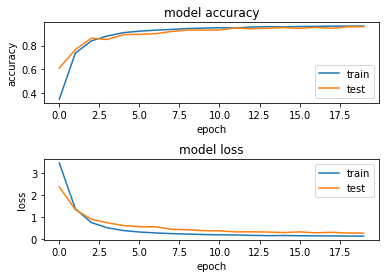

Final Test Accuracy: 0.970958948135376


In [11]:
# Select the final model based on the max test accuracy across all models

best_model_index = model_accuracy.index(max(model_accuracy))

best_model = models[best_model_index]
best_model_history = model_history[best_model_index]
best_model_train_acc = model_train_acc[best_model_index]
best_model_train_loss = model_train_loss[best_model_index]
best_model_val_acc = model_val_acc[best_model_index]
best_model_val_loss = model_val_loss[best_model_index]

# summarize history for accuracy  
plt.subplot(211)  
plt.plot(best_model_history.history['accuracy'])  
plt.plot(best_model_history.history['val_accuracy'])  
plt.title('model accuracy')  
plt.ylabel('accuracy')  
plt.xlabel('epoch')  
plt.legend(['train', 'test'], loc='lower right')  

# summarize history for loss
plt.subplot(212)  
plt.plot(best_model_history.history['loss'])  
plt.plot(best_model_history.history['val_loss'])  
plt.title('model loss')  
plt.ylabel('loss')  
plt.xlabel('epoch')  
plt.legend(['train', 'test'], loc='upper right')  
plt.subplots_adjust(hspace=0.7)

plt.show() 

print("Final Test Accuracy:", model_accuracy[best_model_index])

In [12]:
# Evaluate the best model on the test data
y_pred = best_model.predict(X_test)

# np.argmax() is used to convert the one-hot encoded predictions and test labels to class labels.
y_pred_label = np.argmax(y_pred, axis = 1)

# Print the classification report
print("Classification report:\n", classification_report(y_test_enc, y_pred_label))


ValueError: in user code:

    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\engine\training.py", line 2137, in predict_function  *
        return step_function(self, iterator)
    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\engine\training.py", line 2123, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\engine\training.py", line 2111, in run_step  **
        outputs = model.predict_step(data)
    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\engine\training.py", line 2079, in predict_step
        return self(x, training=False)
    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\utils\traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\engine\input_spec.py", line 296, in assert_input_compatibility
        f'Input {input_index} of layer "{layer_name}" is '

    ValueError: Input 0 of layer "sequential_33" is incompatible with the layer: expected shape=(None, 17), found shape=(None, 20)


In [ ]:
# extract class labels from test data
class_test = y_test_enc

# Invert OsID_labels dictionary
inv_OsID_labels = {v: k for k, v in OsID_labels.items()}

# map OsID values to the class labels
OsID_test = [inv_OsID_labels.get(value, 'Unknown') for value in class_test]

# create dataframe with OsID, true class, predicted class, and true/false columns
results = pd.DataFrame({
    'OsID': OsID_test,
    'True Class': y_test_enc,
    'Predicted Class': y_pred_label,
    'True/False': class_test == y_pred_label
})

# display dataframe
print(results.head())

# save results_df to a CSV file
results.to_csv('MLP_gene classification.csv', index=False)

           OsID  True Class  Predicted Class  True/False
0  Os11g0704500         328              328        True
1  Os09g0279600         161              161        True
2  Os03g0669100          17               17        True
3  Os05g0542500          34               34        True
4  Os09g0522000           7                7        True
